In [1]:
import os
from functools import partial
from typing import Tuple, List, Dict, Any

import jax
import jax.numpy as jnp
import jax.random as jr 
import haiku as hk
import jraph
import optax
import numpy as np
import matplotlib.pyplot as plt

from gnn import graph_network_fn #net_fn
from data import (
    make_graph, 
    pad_graph_to_value, 
    make_neighbour_graph)
from utils import (
    get_R_z_string, 
    adjacency_matrix, 
    print_graph_attributes)

Notes:
* loss for batch of padded graphs calculated by masking out the additional padding graph, so use `.sum()` not `.mean()` for calculating loss. This is because the un-masking keeps the shape concrete meaning that there are zero entries in the batch-loss vector, that should not weight in the scalar-loss average.

#### globals

In [2]:
Array = jnp.ndarray
Graph = jraph.GraphsTuple
Params = hk.Params
Key = jr.PRNGKey

N_GRAPHS = 2000 # = n_sims
LR = 6.e-4
ACTIVATION = jax.nn.swish
BATCH_SIZE = 16
N_STEPS = 5_000
PAD_VALUE = 4096 #2048 #8128 
F = 128
E = 128

pad = True 

moments = True 

net_fn = graph_network_fn

#### data

In [3]:
prng_seq = hk.PRNGSequence(0)

data_dir = "/Users/Jed.Homer/phd/lfi/jaxdelfi/data/"
resolution = 1024 

redshifts = [0.]#, 0.5, 1.]
R_values = ["5.0", "10.0", "15.0", "20.0"][:]

print(f"Running for redshifts:\n\t{redshifts}\nat resolution x={resolution} with R values:\n\t{R_values}.")

Rz_string = get_R_z_string(R_values, redshifts, n_moments_calculate=3)

Running for redshifts:
	[0.0]
at resolution x=1024 with R values:
	['5.0', '10.0', '15.0', '20.0'].


In [4]:
if not moments:
    graph_builder_fn = make_neighbour_graph
else:
    graph_builder_fn = partial(
        make_graph, 
        redshift=redshifts[0], 
        Rs=jnp.array([float(R) for R in R_values]))

#### data
* for each moments datavector, make fully connected subgraph for each redshift, then concatenate all the redshift graphs together...

In [5]:
alpha = jnp.array([
    0.3175, 0.049, 0.6711, 0.9624, 0.834])
parameters = jnp.load(
    os.path.join(data_dir, f"ALL_PDFS_PARAMS.npy")) 
if moments:
    fiducial_dv = jnp.load(
        os.path.join(data_dir, f'fiducial_moments_unflat_{Rz_string}.npy')).mean(axis=0)
    simulations = jnp.load(
        os.path.join(data_dir, f"CALCULATED_PDF_MOMENTS_{Rz_string}.npy"))
else:
    simulations = jnp.load(
        os.path.join(data_dir, f"latin_pdfs_cut_{Rz_string}.npy"))
    fiducial_dv = jnp.load(
        os.path.join(data_dir, f"fiducial_pdfs_cut_{Rz_string}.npy"))
fiducial_dv = fiducial_dv.mean(axis=0)[jnp.newaxis, :]

n_sims, parameter_dim = parameters.shape
data_dim = np.prod(fiducial_dv.shape)

parameters.shape, simulations.shape, fiducial_dv.shape

((2000, 5), (2000, 1, 4, 3), (1, 4, 3))

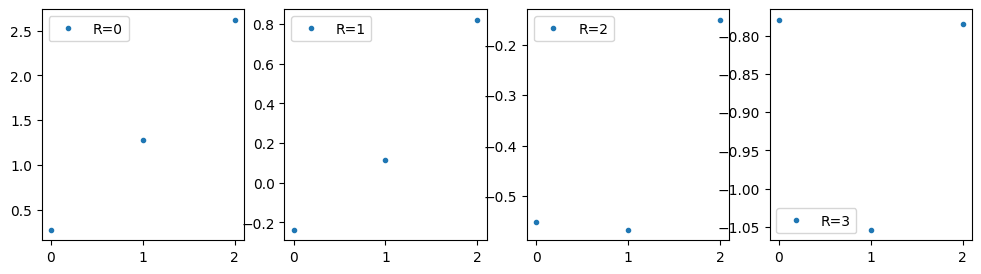

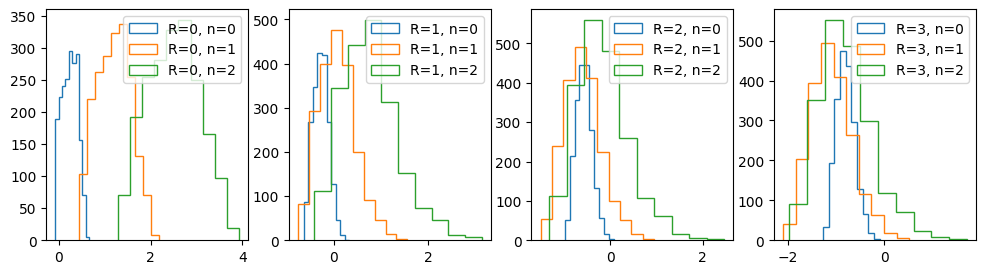

(1, 4, 3)

In [6]:
fig, axs = plt.subplots(1, len(R_values), figsize=(len(R_values) * 3., 3.))
fiducial_dv_ = np.log10(fiducial_dv)
for R in range(len(R_values)):
    ax = axs[R]
    ax.plot(fiducial_dv_.squeeze()[R], linestyle="", marker=".", label=f"R={R}")
    ax.legend()
plt.show()
fiducial_dv.shape

fig, axs = plt.subplots(1, len(R_values), figsize=(len(R_values) * 3., 3.))
simulations_ = np.log10(simulations)
for R in range(len(R_values)):
    ax = axs[R]
    for n in range(simulations.shape[-1]):
        ax.hist(simulations_[:, 0, R, n], label=f"R={R}, n={n}", histtype="step")
    ax.legend()
plt.show()
fiducial_dv.shape

In [7]:
log_scale = True 
if log_scale:
    simulations = np.log10(simulations)
    fiducial_dv = np.log10(fiducial_dv)

In [8]:
g = graph_builder_fn(fiducial_dv)
print_graph_attributes(g)

node_features: (12, 3)
nodes (12, 3)
edges None
senders (132,)
receivers (132,)
globals (1, 2)
n_node (1,)
n_edge (1,)


/Users/Jed.Homer/miniconda3/envs/jraph/lib/python3.10/site-packages/jraph/_src/utils.py:882: FutureWarning: jax.tree_leaves is deprecated, and will be removed in a future release. Use jax.tree_util.tree_leaves instead.
  num_node_features = jax.tree_leaves(node_features)[0].shape[0]
/Users/Jed.Homer/miniconda3/envs/jraph/lib/python3.10/site-packages/jraph/_src/utils.py:887: FutureWarning: jax.tree_leaves is deprecated, and will be removed in a future release. Use jax.tree_util.tree_leaves instead.
  if n_graph != jax.tree_leaves(global_features)[0].shape[0]:


In [9]:
print(
    "nodes", g.nodes.shape, 
    "\nedges", g.edges, 
    "\nglobals", g.globals, 
    "\nsenders", g.senders.shape, 
    "\nreceivers", g.receivers.shape, 
    "\nglobals", g.globals.shape)

nodes (12, 3) 
edges None 
globals [[ 12. 144.]] 
senders (132,) 
receivers (132,) 
globals (1, 2)


In [10]:
# This is the number of nodes in the graph (there are n_R * n_m for each of the n_z subgraphs)
g.senders.max()

DeviceArray(11, dtype=int32)

In [11]:
print_graph_attributes(g)

nodes (12, 3)
edges None
senders (132,)
receivers (132,)
globals (1, 2)
n_node (1,)
n_edge (1,)


In [12]:
s, r = jnp.meshgrid(jnp.arange(5), jnp.arange(5))

In [13]:
x = jnp.eye(64, k=-1) + jnp.eye(64, k=+1)
senders, receivers = jnp.argwhere(x > 0.).T
# plt.imshow(x)
senders.shape, receivers.shape


((126,), (126,))

[[0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0.]]


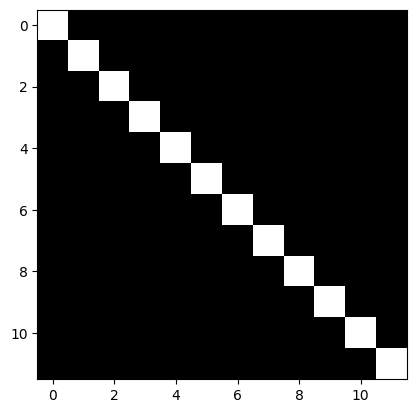

In [14]:
if 1:
    # Expect three squares on diagonal: FULLY connected subgraphs
    A = adjacency_matrix(g.senders, g.receivers)
    print(A)
    plt.imshow(A, cmap="gray_r")
    plt.show()

#### trainer functions

In [15]:
dataset_processed = []
for n in range(N_GRAPHS):
    
  l = parameters[n]
  g = graph_builder_fn(simulations[n])

  dataset_processed.append(dict(input_graph=g, target=l))

  print("\r", l, end="")
  print((f"nodes {g.nodes.shape}" +
         f"\nedges {g.edges}" + 
         f"\nn_node {g.n_node}" + 
         f"\nn_edge {g.n_edge}" + 
         f"\nglobals {g.globals}" + 
         f"\nsenders {g.senders.shape}" + 
         f"\nreceivers {g.receivers.shape}" +
         f"\nglobals {g.globals.shape}"))

node_features: (12, 3)
 [0.1755  0.06681 0.7737  0.8849  0.6641 ]nodes (12, 3)
edges None
n_node [12]
n_edge [132]
globals [[ 12. 144.]]
senders (132,)
receivers (132,)
globals (1, 2)
node_features: (12, 3)
 [0.2139  0.05557 0.8599  0.9785  0.8619 ]nodes (12, 3)
edges None
n_node [12]
n_edge [132]
globals [[ 12. 144.]]
senders (132,)
receivers (132,)
globals (1, 2)
node_features: (12, 3)
 [0.1867  0.04503 0.6189  0.8307  0.7187 ]nodes (12, 3)
edges None
n_node [12]
n_edge [132]
globals [[ 12. 144.]]
senders (132,)
receivers (132,)
globals (1, 2)
node_features: (12, 3)
 [0.3271  0.06875 0.6313  0.8135  0.8939 ]nodes (12, 3)
edges None
n_node [12]
n_edge [132]
globals [[ 12. 144.]]
senders (132,)
receivers (132,)
globals (1, 2)
node_features: (12, 3)
 [0.1433  0.06347 0.6127  1.1501  0.7699 ]nodes (12, 3)
edges None
n_node [12]
n_edge [132]
globals [[ 12. 144.]]
senders (132,)
receivers (132,)
globals (1, 2)
node_features: (12, 3)
 [0.4813  0.05637 0.5331  0.9041  0.9289 ]nodes (12, 3)
e

In [16]:
g.senders.shape, g.receivers.shape
# g.senders.max(), len(g.nodes)
# g.senders[-1]

((132,), (132,))

In [17]:
# plt.plot(g.nodes, linestyle="", marker=".")
# for n in range(len(g.nodes)):
#     connections = g.senders[n]
#     print(connections.shape)
#     sent_attributes = jax.tree_util.tree_map(lambda n: n[senders], g.nodes)
#     print(sent_attributes.shape)
#     break
# plt.show()

In [18]:
# Make a batch of graphs to test batching
gs, ls = [], []
for _ in range(5):
  gl = dataset_processed[_]
  g, l = gl.values()
  gs.append(g), ls.append(l)

g_all = jraph.batch(gs)
print([g.nodes.shape for g in gs])
g_all.nodes.shape
print(g_all.n_node)
print(g_all.n_edge)

print_graph_attributes(g_all)

[(12, 3), (12, 3), (12, 3), (12, 3), (12, 3)]
[12 12 12 12 12]
[132 132 132 132 132]
nodes (60, 3)
edges None
senders (660,)
receivers (660,)
globals (5, 2)
n_node (5,)
n_edge (5,)


In [19]:
# Set the graph globals to zero at first?
print(dataset_processed[0]["target"], dataset_processed[0]["input_graph"].globals)
len(dataset_processed)

[0.1755  0.06681 0.7737  0.8849  0.6641 ] [[ 12. 144.]]


2000

In [20]:
jnp.ones((3, 1)) * jnp.array([True, True, False])[:, None]

DeviceArray([[1.],
             [1.],
             [0.]], dtype=float32)

In [21]:
def compute_loss(
  params: Params, 
  key: Key,
  graph: Graph, 
  label: Array,
  net: Graph,
  inference: bool = False) -> Tuple[Array, Array]:
  pred_graph = net.apply(params, key, graph, inference=inference)
  mask = jraph.get_graph_padding_mask(pred_graph)
  print("mask", mask.shape)
  print(pred_graph.globals.shape, label.shape)
  loss = jnp.square(jnp.subtract(pred_graph.globals, label)) 
  print("loss", loss.shape)
  # Mean accounting for zero-padding
  loss = (loss * mask[:, None]).sum() / (loss.shape[0] - 1.)#.mean()
  return loss, (None,)

def get_graphs(key, dataset):
  # Randomly choose BATCH_SIZE number of (graphs, label) tuples
  idx = jr.randint(
    key, shape=(BATCH_SIZE,), minval=0, maxval=len(dataset))

  gs, ls = [], []
  for i in idx:
    g, l = dataset[int(i)].values()
    gs.append(g), ls.append(l)

  graph = jraph.batch(gs)
  if pad:
    graph = pad_graph_to_value(graph, PAD_VALUE)

  label = jnp.stack(ls)
  if pad:
    label = jnp.concatenate([label, jnp.zeros((1, parameter_dim))])
  print("label", label)
  return graph, label

def train(
  dataset: List[Dict[str, Any]], 
  num_train_steps: int) -> Tuple[Params, List, List]:

  prng_seq = hk.PRNGSequence(0)

  net = hk.transform(net_fn)

  train_dataset = [
    dataset[t] for t in range(int(0.9 * N_GRAPHS))]
  valid_dataset = [
    dataset[-v] for v in range(int(0.1 * N_GRAPHS))]

  graph = train_dataset[0]['input_graph']
  if pad:
    graph = pad_graph_to_value(graph, PAD_VALUE)
  params = net.init(next(prng_seq), graph)

  print(f"n_params = {sum(x.size for x in jax.tree_util.tree_leaves(params)):.2E}")

  # Initialize the optimizer.
  opt_init, opt_update = optax.adabelief(LR)
  opt_state = opt_init(params)

  compute_loss_ = partial(compute_loss, net=net, inference=False)
  compute_loss_fn = jax.jit(
    jax.value_and_grad(compute_loss_, has_aux=True))
  eval_fn = jax.jit(partial(compute_loss, net=net, inference=True))

  train_losses, valid_losses = [], []
  for s in range(num_train_steps):
    print(next(prng_seq))

    # Train
    graph, label = get_graphs(next(prng_seq), train_dataset)
    print("global/label", graph.globals.shape, label.shape)

    # Zero out global label, model must predict it, init'd with cardinalities so don't remove!
    # graph = graph._replace(globals=jnp.zeros_like(graph.globals))

    # graph = pad_graph_to_value(graph, PAD_VALUE)
    (train_loss, (_)), grad = compute_loss_fn(params, next(prng_seq), graph, label)

    updates, opt_state = opt_update(grad, opt_state, params)
    params = optax.apply_updates(params, updates)

    # Validate
    graph, label = get_graphs(next(prng_seq), valid_dataset)
    # print("globals", graph.globals)
    # graph = pad_graph_to_value(graph, PAD_VALUE)
    valid_loss, _ = eval_fn(params, None, graph, label)

    if s % 100 == 0:
      print(f'\rstep: {s:06d}, L: {train_loss:.4f} L_v: {valid_loss:.4f}', end="")

    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

  return params, train_losses, valid_losses 

#### check

In [22]:
print([_.shape for _ in g_all if _ is not None])

[(60, 3), (660,), (660,), (5, 2), (5,), (5,)]


In [23]:
g_all.globals.shape, g_all.globals 

((5, 2),
 DeviceArray([[ 12., 144.],
              [ 12., 144.],
              [ 12., 144.],
              [ 12., 144.],
              [ 12., 144.]], dtype=float32))

In [24]:
key = jr.PRNGKey(0)
key, _ = jr.split(key)

# net = hk.without_apply_rng(hk.transform(net_fn))
net = hk.transform(net_fn)

if pad:
    graph = pad_graph_to_value(g_all, PAD_VALUE)
else:
    graph = g_all
print(graph.globals, graph.globals.shape)

params = net.init(key, g_all)

y_ = net.apply(params, key, g_all)
print("net out", y_.globals.shape)

mask = jraph.get_graph_padding_mask(y_)
print("mask, y_.globals", mask.shape, y_.globals.shape)

jnp.argmax(y_.globals[:, mask], axis=1), l.argmax()
# jnp.argmax(y_.globals[mask], axis=1), l.argmax()

[[ 12. 144.]
 [ 12. 144.]
 [ 12. 144.]
 [ 12. 144.]
 [ 12. 144.]
 [  0.   0.]] (6, 2)
net out (5, 5)
mask, y_.globals (5,) (5, 5)


(DeviceArray([1, 1, 1, 1, 1], dtype=int32), DeviceArray(3, dtype=int32))

In [25]:
key = jr.PRNGKey(0)
key, _ = jr.split(key)

net = hk.transform(net_fn)

ix1, ix2 = jr.randint(key, (2,), 0, len(dataset_processed))

graph = dataset_processed[ix1]['input_graph']
l = dataset_processed[ix1]['target']
if pad:
    graph = pad_graph_to_value(graph, PAD_VALUE)
print(graph.globals, graph.globals.shape)

print_graph_attributes(graph)

params = net.init(key, graph)

graph = dataset_processed[ix2]['input_graph']
l = dataset_processed[ix2]['target']
if pad:
    graph = pad_graph_to_value(graph, PAD_VALUE)

y_ = net.apply(params, key, graph)
print("net out", y_.globals.shape)

mask = jraph.get_graph_padding_mask(y_)
print("mask, y_.globals", mask.shape, y_.globals.shape)

# jnp.argmax(y_.globals[mask], axis=1), l.argmax()

[[ 12. 144.]
 [  0.   0.]] (2, 2)
nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)
net out (2, 5)
mask, y_.globals (2,) (2, 5)


In [26]:
graph = dataset_processed[ix2]['input_graph']
print("before pad", graph.nodes.shape, graph.globals.shape)
l = dataset_processed[ix2]['target']
if pad:
    graph = pad_graph_to_value(graph, PAD_VALUE)
print("after pad", graph.nodes.shape, graph.globals.shape)

before pad (12, 3) (1, 2)
after pad (4097, 3) (2, 2)


In [27]:
dataset_processed[0]["target"].shape

(5,)

In [28]:
params, train_losses, valid_losses = train(dataset_processed, num_train_steps=N_STEPS)

n_params = 3.40E+01
[1278412471 2182328957]
label [[0.2835  0.06889 0.8319  1.0459  0.7285 ]
 [0.3837  0.06423 0.7447  1.0053  0.8375 ]
 [0.2167  0.04237 0.7445  1.1977  0.7745 ]
 [0.1609  0.04807 0.5143  0.8819  0.8403 ]
 [0.3509  0.04137 0.7367  0.9299  0.8155 ]
 [0.3953  0.05501 0.6057  0.8637  0.7951 ]
 [0.1153  0.06331 0.5589  1.1823  0.8875 ]
 [0.4303  0.05977 0.7609  1.1201  0.9107 ]
 [0.2717  0.06017 0.8021  1.0469  0.6911 ]
 [0.4987  0.04467 0.7865  1.0227  0.8305 ]
 [0.1071  0.03435 0.8899  0.8877  0.9519 ]
 [0.1697  0.06979 0.8387  0.9257  0.8931 ]
 [0.3589  0.06187 0.5019  1.0137  0.8953 ]
 [0.2353  0.06923 0.7497  0.9185  0.6257 ]
 [0.3285  0.03395 0.5737  0.9965  0.6689 ]
 [0.3121  0.03323 0.8121  0.9181  0.6247 ]
 [0.      0.      0.      0.      0.     ]]
global/label (17, 2) (17, 5)
mask (17,)
(17, 5) (17, 5)
loss (17, 5)
label [[0.3501  0.05265 0.8421  0.8099  0.8159 ]
 [0.1939  0.03479 0.8019  0.9069  0.7603 ]
 [0.2633  0.06323 0.7517  1.0139  0.7065 ]
 [0.4747  0.06

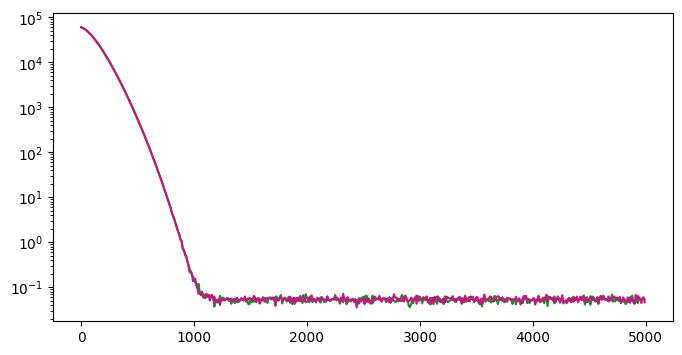

In [30]:
fig, ax = plt.subplots(1, 1, dpi=100, figsize=(8., 4.))
steps = range(0, N_STEPS, 10)
ax.semilogy(steps, train_losses[::10], color="forestgreen")
ax.semilogy(steps, valid_losses[::10], color="mediumvioletred")
plt.show()

In [31]:
graphs = []
for gl in dataset_processed:
    g, l = gl.values()
    graphs.append(g)

all_graphs = jraph.batch(graphs)

print_graph_attributes(all_graphs)

nodes (24000, 3)
edges None
senders (264000,)
receivers (264000,)
globals (2000, 2)
n_node (2000,)
n_edge (2000,)


In [32]:
fiducial_graph = graph_builder_fn(fiducial_dv)
if pad:
    fiducial_graph = pad_graph_to_value(fiducial_graph, PAD_VALUE)
print_graph_attributes(fiducial_graph)

node_features: (12, 3)
nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)


In [33]:
preds = []

for n in range(2000):
    # Latin graph
    graph = graph_builder_fn(simulations[n])
    # print_graph_attributes(graph)
    if pad:
        graph = pad_graph_to_value(graph, PAD_VALUE)
    # print_graph_attributes(graph)
    mask = jraph.get_graph_padding_mask(graph)

    # Predict parameters of graph, RNG=None for inference
    graph = net.apply(params, None, graph, inference=True)
    print(graph.globals.shape, mask)
    print(graph.globals)
    if pad:
        pred = graph.globals[mask]
    else: 
        pred = graph.globals
    print("\r", n, pred.shape, end="")

    preds.append(pred)

node_features: (12, 3)
nodes (12, 3)
edges None
senders (132,)
receivers (132,)
globals (1, 2)
n_node (1,)
n_edge (1,)
nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)
(2, 5) [ True False]
[[0.29190946 0.05113629 0.7174599  1.0094852  0.80388814]
 [0.         0.         0.         0.         0.        ]]
 0 (1, 5)node_features: (12, 3)
nodes (12, 3)
edges None
senders (132,)
receivers (132,)
globals (1, 2)
n_node (1,)
n_edge (1,)
nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)
(2, 5) [ True False]
[[0.29190946 0.05113629 0.7174599  1.0094852  0.80388814]
 [0.         0.         0.         0.         0.        ]]
 1 (1, 5)node_features: (12, 3)
nodes (12, 3)
edges None
senders (132,)
receivers (132,)
globals (1, 2)
n_node (1,)
n_edge (1,)
nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)
(2, 5) [ True False]
[[0.29190946 0.05113629 0.71

In [34]:
preds = jnp.asarray(preds).squeeze()
preds.shape

(2000, 5)

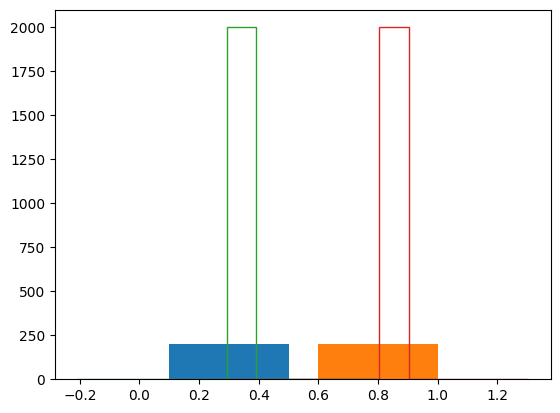

In [35]:
preds = jnp.asarray(preds).squeeze()
plt.figure()
plt.hist(parameters[:, 0])
plt.hist(parameters[:, 4])
plt.hist(preds[:, 0], histtype="step")
plt.hist(preds[:, 4], histtype="step")
plt.show()

In [36]:
preds = jnp.asarray(preds).squeeze()
preds.shape

(2000, 5)

In [37]:
# all_graphs_out = net.apply(params, None, all_graphs, inference=True)
print_graph_attributes(fiducial_graph)
fiducial_graph_out = net.apply(params, None, fiducial_graph, inference=True)
# preds = all_graphs_out.globals
fiducial_preds = fiducial_graph_out.globals
mask = jraph.get_graph_padding_mask(fiducial_graph)
fiducial_preds.shape, mask.shape

fiducial_preds = fiducial_preds[mask]

# fiducial_preds.shape, fiducial_preds, preds

nodes (4097, 3)
edges None
senders (4096,)
receivers (4096,)
globals (2, 2)
n_node (2,)
n_edge (2,)


In [38]:
# List of graphs
# unbatched_graphs = jraph.unbatch(all_graphs_out)

senders and receivers are constant through application of graph interaction network, try attention mechanism

In [39]:
# A = adjacency_matrix(unbatched_graphs[0].senders, unbatched_graphs[0].receivers)
# plt.imshow(A, cmap="gray_r")
# plt.show()

In [40]:
if 0:
    A = adjacency_matrix(fiducial_graph_out.senders, fiducial_graph_out.receivers)
    plt.imshow(A, cmap="gray_r")
    plt.show()

In [41]:
# pred_targets, alpha[jnp.array([0, 4])]
fiducial_preds.shape

(1, 5)

In [42]:
idx = jnp.arange(10)
x = -jnp.arange(10)
y = jax.tree_util.tree_map(lambda n: n[idx], x)
y

DeviceArray([ 0, -1, -2, -3, -4, -5, -6, -7, -8, -9], dtype=int32)

(2000, 2) (2000, 2)


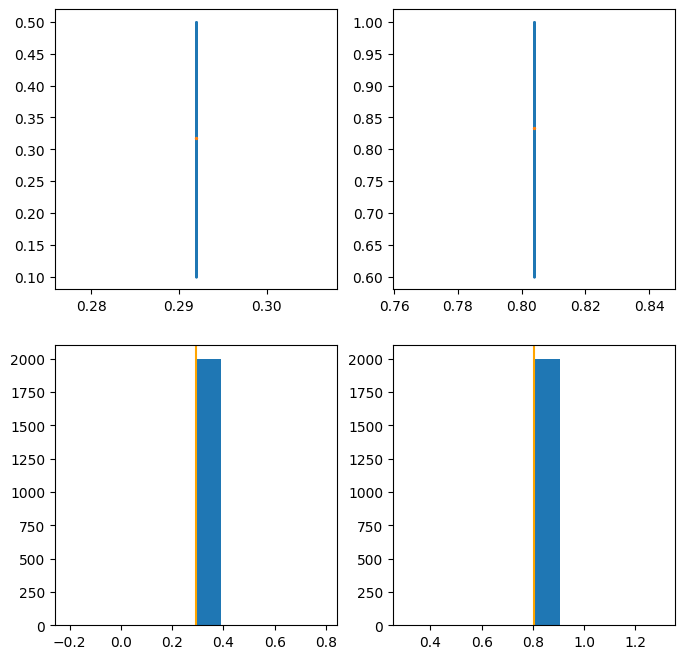

In [43]:
target_idx = jnp.array([0, 4])
pred_targets = preds[:, target_idx]
parameter_targets = parameters[:N_GRAPHS, target_idx]

print(pred_targets.shape, parameter_targets.shape)

fig, axs = plt.subplots(2, 2, figsize=(8., 8.), dpi=100)
ax = axs[0, 0]

ax.scatter(pred_targets[:, 0], parameter_targets[:, 0], s=0.5)
ax.scatter(fiducial_preds[:, 0], alpha[None, :][:, 0], s=2.)
ax = axs[0, 1]
ax.scatter(pred_targets[:, 1], parameter_targets[:, 1], s=0.5)
ax.scatter(fiducial_preds[:, 4], alpha[None, :][:, 4], s=2.)
ax = axs[1, 0]
ax.hist(pred_targets[:, 0])
ax.axvline(fiducial_preds[:, 0], color="orange")
ax = axs[1, 1]
ax.hist(pred_targets[:, 1])
ax.axvline(fiducial_preds[:, 4], color="orange")
plt.show()

In [45]:
fiducial_preds.shape

(1, 5)

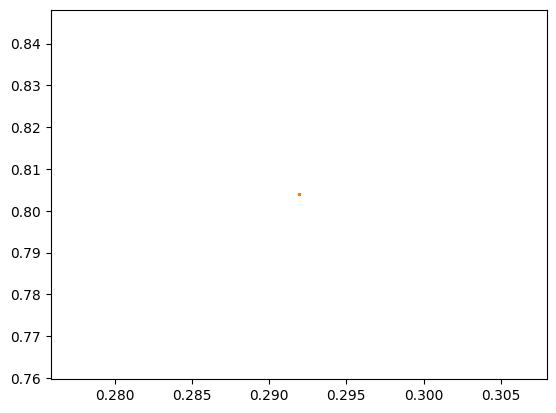

In [46]:
plt.figure()
plt.scatter(*pred_targets.T, s=0.5)
plt.scatter(*fiducial_preds[:, target_idx].T, s=2.)
plt.show()

In [47]:
fiducial_dv.shape

(1, 4, 3)

In [48]:
fiducial_dv.shape

(1, 4, 3)

In [49]:
# Try gnn on datavector with more or less moments

fiducial_dv_ = fiducial_dv#[:1, :2, :1]

fiducial_subgraphs_ = make_subgraphs(fiducial_dv_)
fiducial_graph_ = make_graph_from_subgraphs(fiducial_subgraphs_, alpha[None, :])

fiducial_graph_out = net.apply(params, None, fiducial_graph_, inference=True)

NameError: name 'make_subgraphs' is not defined

In [ ]:
fiducial_graph.globals, fiducial_graph_out.globals

(DeviceArray([[ 5.710438, 10.721063]], dtype=float32),
 DeviceArray([[ 0.5978021 , -0.10030725,  1.5181686 ,  1.4901392 ,
               -0.06705358]], dtype=float32))